                                    EXPLORATION DES DONNEES ET DATA VISUALISATION 

In [2]:
# importation des modules
import numpy as np 
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

from scipy.stats import pearsonr
import statsmodels.api

In [ ]:
"""Avant de continuer la suite du code 'si execution en interne' s'assurer d'avoir exécuter le notebook Creation_du_dataframe.
Cela permet de creer le DataFrame contenant toutes les données pour la data visualisation """

        1 - Ouverture du DataFrame 

In [4]:
# lecture du fichier dataframe
df = pd.read_csv('V2_Plant_Seedlings_DataFrame.csv')
df.head()

,filepath,species,image_name,height,width,R_mean,G_mean,B_mean,luminosity,sharpness_score,image_size,square
0,C:\Users\zammi\Desktop\DATA_SCIENCE\Projet_ re...,Black-grass,15.png,147,147,86.006109,69.395668,51.121894,68.841224,8.013780,21609,square
1,C:\Users\zammi\Desktop\DATA_SCIENCE\Projet_ re...,Black-grass,88.png,181,181,72.084155,57.116999,42.875004,57.358719,10.732770,32761,square
2,C:\Users\zammi\Desktop\DATA_SCIENCE\Projet_ re...,Black-grass,151.png,638,638,87.168107,68.065462,49.185226,68.139598,127.819102,407044,square
3,C:\Users\zammi\Desktop\DATA_SCIENCE\Projet_ re...,Black-grass,278.png,531,531,90.145336,79.522381,69.335855,79.667857,99.007011,281961,square
4,C:\Users\zammi\Desktop\DATA_SCIENCE\Projet_ re...,Black-grass,182.png,115,115,85.214820,68.097467,47.529301,66.947196,3.812277,13225,square


•	filepath permet d’accéder à chaque image du jeu de donnée par le biais de son chemin d’accès vers le fichier correspondant.

•	species cumule 12 modalités correspondant à l’espèce de la plante représentée sur l’image en question.

•	image_name  est le nom du fichier.

•	height et width sont respectivement la hauteur et la taille de l’image.

•	image_size est le nombre de pixels composant l’image.

•	square possède 2 modalités et décrit si l’image est carrée ou non.

•	R_mean, V_mean et B_mean désignent la moyenne de l’intensité lumineuse d’un pixel de l’image dans le codage RVB, c’est-à-       dire l’intensité d’un pixel de l’image respectivement en rouge, vert et bleu.

•	luminosity quantifie la luminosité de l’image : plus la valeur est élevée, moins l’image  est sombre.

•	sharpness_score quantifie la netteté d’une image : plus la valeur est élevée, plus l’image est nette.


        2 - Inspection de la composition du dataset 

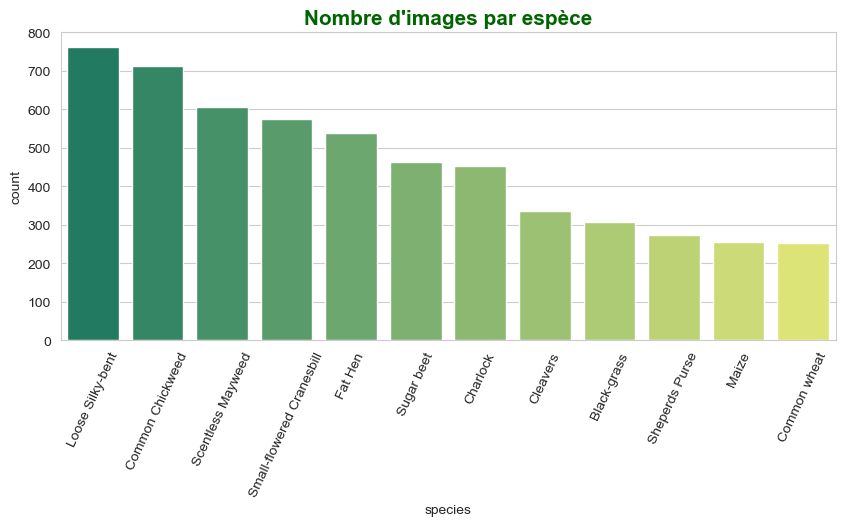

In [9]:
#Countplot du nombre d'image par classe
plt.figure(figsize=(10,4))

sns.set_style("whitegrid")
sns.countplot(x='species', palette="summer", data=df, order=df.value_counts("species").index)

plt.xticks(rotation=65)
plt.title("Nombre d'images par espèce", color ='darkgreen', fontsize = 15, fontweight = 'extra bold')
plt.show()

In [10]:
df.species.value_counts(normalize=True)

Loose Silky-bent             0.137570
Common Chickweed             0.128724
Scentless Mayweed            0.109587
Small-flowered Cranesbill    0.103990
Fat Hen                      0.097129
Sugar beet                   0.083589
Charlock                     0.081603
Cleavers                     0.060480
Black-grass                  0.055786
Sheperds Purse               0.049467
Maize                        0.046398
Common wheat                 0.045676
Name: species, dtype: float64

On constate une certaine disparité entre les classes d'espèce de plantes : si la moyenne d'images par dossier avoisine les 450, les 5539 images composant le dataset ne sont pas distribuées équitablement. 
De fait, Loose Silky-bent qui est la classe la plus commune possède 3 fois plus d'images que Common wheat, la classe minoritaire de notre dataset.

Les espèces issues de l'agriculture (Wheat, Maize & Beet) sont en minorité comparées aux mauvaises herbes.

L'illustration 3 entre les effectifs de la classe majoritaire (Loose Silky-bent) et ceux de la classe minoritaire (Common wheat) nous conduit néanmoins à considérer que le déséquilibre observé entre les classes demeure relativement modéré.



        3 - Visualisation de quelques photos 

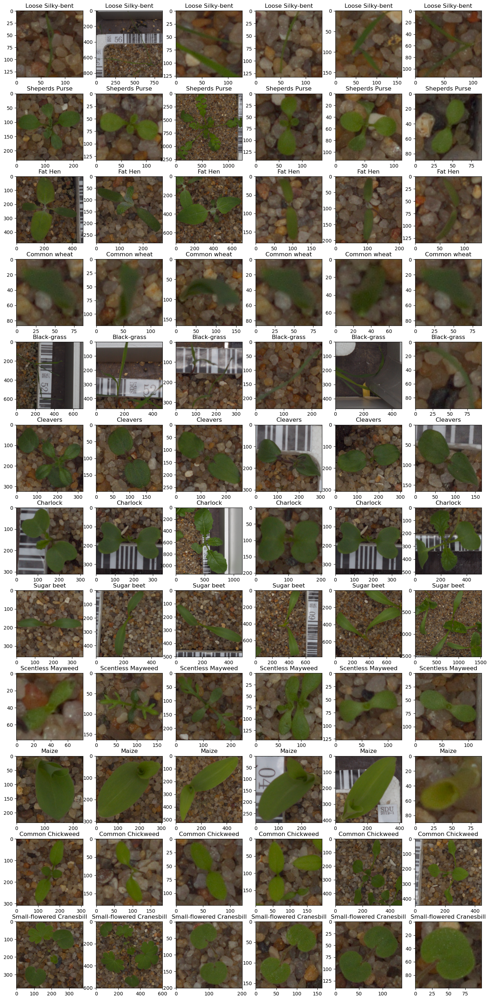

In [5]:
## 6 photos aléatoires par espèce de plante
#Fonction retournant x indices d'images aléatoires par espèce pour un dataframe
def indice(x, df, num_of_species=12):
    if num_of_species > 12:
        print("Il n'y a que 12 espèces.")
    elif x > min(df.species.value_counts()):
            print ("Le dataset ne contient que",df.species.value_counts().sort_values()[0], df.species.value_counts().sort_values().index[0],".")
    else:
        indices = []
        for s in np.random.choice(df.species.unique(), size=num_of_species, replace=False):
            for i in range(x):
                idx = np.random.choice(df[df.species == s].index, replace = False)
                indices.append(idx)
    return indices

#Affichage de 6 images aléatoires par espèce de plante
fig, ax = plt.subplots(12, 6, figsize=(17, 36))
plt.grid(False) 

for i, ax in zip(indice(6, df), ax.flat):
    filepath = df["filepath"][i]
    img = plt.imread(filepath)
    ax.imshow(img)
    ax.set_title(df['species'][i])

Plusieurs observations peuvent être émises :

•	Les photos sont prises en vue du dessus.

•	Les dimensions des images varient singulièrement.

•	Certaines images sont plus floues que d'autres, le flou pouvant atteindre un niveau élevé pour certaines photographies.

•	Il ne semble pas y avoir de fond propre à une classe : le fond de chaque image paraît composé de cailloux et/ou d'une barquette et ce, indépendamment de la variété qu'elle représente.

•	On note également la présence ponctuelle d'une bande de mesure issue de la barquette, qui prend une grande partie sur certaines images.

•	En comparant la taille des cailloux composant le fond de la plupart des images, on comprend que certaines photographies ont été prises plus proches du sol que d'autres.

•	Les 12 variétés exhibent des plantes d'une teinte de vert similaire. De plus les cailloux sont aussi toujours dans les mêmes tons. 

•	Il arrive qu'une image dispose d'un fond où le noir et le blanc dominent, cela est dû au mesureur de la barquette ainsi que du sol.

•	Les photographies ont été prises à différentes étapes du cycle de croissance des plantes. Par exemple, pour la même espèce, certaines images montrent une seule feuille tandis que d’autres montrent un spécimen plus mature avec plusieurs grandes feuilles.


        4 - Dimensions des images

In [6]:
#Nuage de points des dimensions des images pour chaque espèce
fig = px.scatter(df, x="width", y="height", color="species", size="width", hover_name="image_name")
fig.update_layout(title=dict(text="Dimension des images par espèce", font=dict(size=25), x=0.4))
fig.show()

La majorité des images ne font pas plus de 1500 par 1500 pixels.

La plus petite image fait 49x49 pixels tandis que la plus grande fait 3652x3457 pixels. Nous avions précédemment émis le constat que les dimensions des images variaient sensiblement. Nous pouvons à présent également affirmer que la grande majorité des images sont carrées. Seules quelques-unes semblent ne pas l'être. Identifions-les.



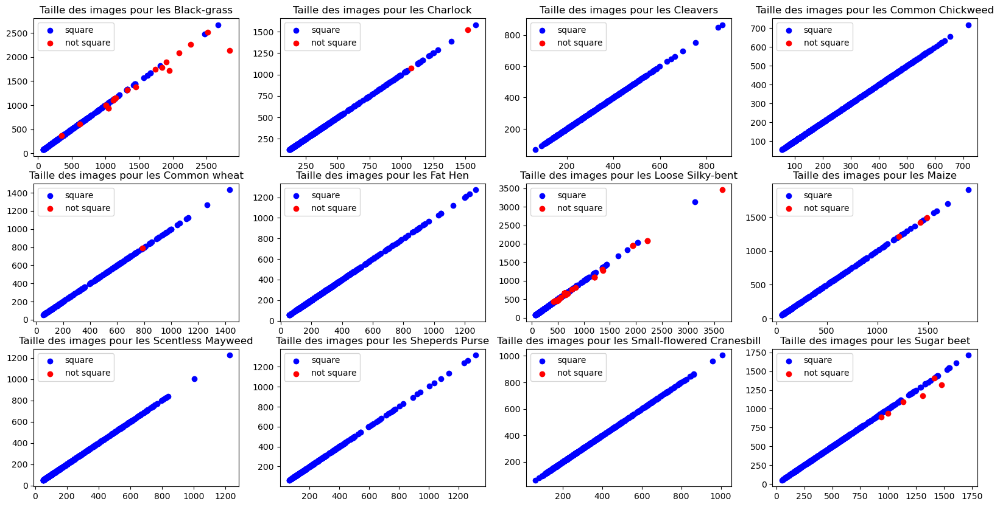

In [3]:
# Nuage de points des dimensions des images pour chaque espèce
species = df['species'].unique()
plt.figure(figsize = (20,10))

for i in range(len(species)) : 
    plt.subplot(3,4,i+1)
    plt.scatter(x='width',y= 'height', data = df[(df['species'] == species[i]) & (df['width'] == df['height'])],
                color = "blue") 
    plt.scatter(x='width',y= 'height', data = df[(df['species'] == species[i]) & (df['width'] != df['height'])],
                color = "red")
    plt.title('Taille des images pour les '+ species[i])
    plt.legend(["square", "not square"], loc="best");

Sur ce graphique, les points bleus représentent les images carrées et les points rouges représentent les images non carrées. Chaque graphique représente une espèce.

Il y a un total de 68 images non carrées ce qui correspond à 0.01% des images du Dataset.

Les variétés Sugar beet, Loose Silky-bent ainsi que Black-grass cumulent quasiment à elles trois l'intégralité des images non carrées.  Black-grass, en particulier, frappe par son fort taux d'images aux dimensions asymétriques, elle qui fait partie des classes minoritaires du dataset.



In [4]:
#Test de Pearson entre la largeur et la hauteur d'une image du dataset 
print(" Test de Pearson entre la taille et la hauteur d'une image du dataset: \n Coefficient de Pearson :{:8.4f} %,    p-value :{:4} %"
       .format(pearsonr(df.height, df.width)[0], pearsonr(df.height, df.width)[1]))

 Test de Pearson entre la taille et la hauteur d'une image du dataset: 
 Coefficient de Pearson :  0.9992 %,    p-value : 0.0 %


La p-value est inférieure à 5%, on rejette donc l'hypothèse nulle d’indépendance des variables height et width: il y a bel et bien une corrélation significative et positive entre la largeur et la hauteur d’une image. Plus l'une des deux valeurs est élevée et plus l'autre valeur sera élevée, et inversement.

Puisque la quasi-totalité des images sont carrées, nous nous baserons à présent arbitrairement sur la hauteur afin d'évaluer la distribution de la taille des images.




In [7]:
#Boxplot de la distribution de la taille des images par espèce
fig = px.box(df, x='height', color='species', hover_name="image_name")
fig.update_layout(title=dict(text="Distribution de la taille des images par espèce", font=dict(size=25), x=0.45))
fig.show()

Le boxplot met en lumière :

•	L'existence d'outliers pour chaque classe.

•	Une distribution inconsistante entre les classes.

•	Une taille minimum assez similaire pour toutes les classes (~ 60 pixels), à l'exception de Charlock.

•	La distribution de la taille des images varie donc fortement d'une espèce à une autre. 

•	Certaines telles que Common Chickweed ou Scentless Mayweed sont composées d'images de tailles semblables. 

•	D'autres à l'inverse exibent des images de dimensions très variées comme Common Wheat, Maize ou encore Black-grass qui avait déjà été citée précedemment pour son taux anormalement élévé d'images de dimensions asymétriques.

Vérifions qu'il existe une relation statistiquement significative entre la dimension des images et l'espèce d'appartenance par une analyse de la variance à un facteur (ANOVA):



In [33]:
#Test ANOVA entre la dimension des images et l'espèce d'appartenance
result = statsmodels.formula.api.ols('height ~ species', data = df).fit()  #!
table = statsmodels.api.stats.anova_lm(result)
print("Test ANOVA:\nF-statistique:{:6.2f},    p-value :{:6.2f} %".format(table.loc['species','F'],100*table.loc['species','PR(>F)']))

Test ANOVA:
F-statistique: 75.37,    p-value :  0.00 %


Soit HO l'hypothèse nulle:
"L'espèce n'a pas d'influence statistiquement significative sur la dimension des images".

La p value étant inférieur à 0.05, nous rejettons l'hypothèse nulle. L'espèce d'appartenance a bien un effet statistique significatif sur la dimension des images.



        5 - Flou des images

In [8]:
# Nuage de points de la relation entre la netteté et les dimensions de l'image par espèce
fig = px.scatter(df, x="sharpness_score", y="image_size", color="species", hover_name="image_name")
fig.update_layout(title=dict(text="Relation entre les dimensions et la netteté de l'image par espèce", font=dict(size=25), x=0.45),
                 xaxis_title="Dimensions",
                 yaxis_title="Sharpness_score")
fig.show()

On constate une relation de linéarité claire entre les 2 variables: de fait, plus une image est petite et plus elle est floue. 
Procédons à un test statistique afin de nous en assurer :

In [35]:
#Test de Pearson entre la taille et le score de netteté d'une image du dataset
print(" Test de Pearson entre la taille et le score de netteté d'une image du dataset: \n Coefficient de Pearson :{:8.4f} %,    p-value :{:4} %"
       .format(pearsonr(df.height, df.width)[0], pearsonr(df.height, df.width)[1]))

 Test de Pearson entre la taille et le score de netteté d'une image du dataset: 
 Coefficient de Pearson :  0.9992 %,    p-value : 0.0 %


L’hypothèse d’indépendance est rejettée : il y a une corrélation significative et positive entre les 2 variables. 

Une théorie serait que les plus petites images du dataset soient en réalité issues d'un tronquage manuel de photographies initialement plus grandes comportant plusieurs specimens, dans le but d'afficher des images de plantes individuelles.



        6 - Colorimétrie & Luminosité

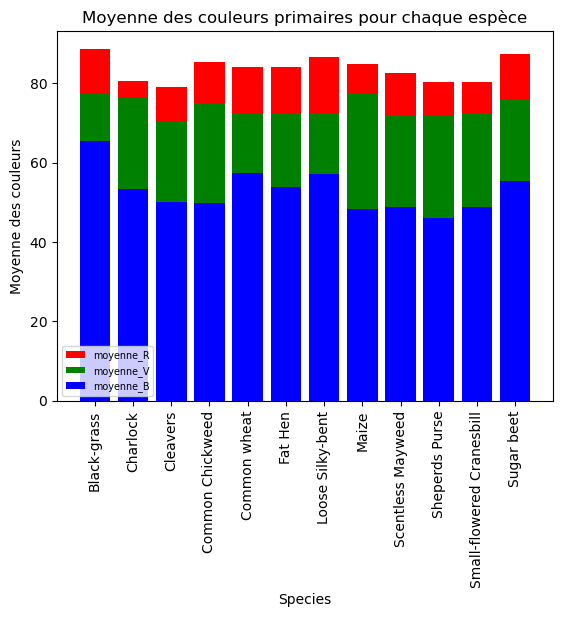

In [12]:
# Fonction renvoyant les moyennes d'une colonne quantitive pour chaque modalité d'une colonne qualitative 
# Retourne un dictionnaire {modalité : moyenne}
def calcul_moyenne (col_num,col_qual) : 
    espece = col_qual.unique()
    a = 0 
    moyenne ={}
    b = []
    for i, j in zip(col_num,col_qual) : 
        if j == espece[a] :
            b.append(i)
            moyenne[j] = sum(b)/len(b)
        else : 
            a = a + 1 
            b = []
    return moyenne

# Calcul des moyennes de chaque couleur primaire (R,V,B) pour chaque espèce (classe)
R = calcul_moyenne(df['R_mean'], df['species'])
V = calcul_moyenne(df['G_mean'], df['species'])
B = calcul_moyenne(df['B_mean'], df['species'])


# Création des données pour le barplot
species = df['species'].unique()
values_R = R.values()
values_V= V.values()
values_B = B.values()

# Affichage d'un barplot des moyennes de chaque couleur (R,V,B) pour chaque espèce
plt.bar(species, values_R,label='moyenne_R', color = 'red')
plt.bar(species,values_V, label='moyenne_V', color ='green')
plt.bar(species, values_B, label='moyenne_B', color = 'blue')

plt.legend(fontsize = 'x-small', loc = 'lower left')
plt.xticks(species, rotation = 90);
plt.xlabel('Species')
plt.ylabel('Moyenne des couleurs')
plt.title('Moyenne des couleurs primaires pour chaque espèce');

La colorimétrie des images ne varie pas sensiblement d'une classe à une autre. Cela confirme les observations antérieures.Toutes les plantes sont de la même teinte de vert. 

Il est également impossible de distinguer une classe d'une autre par le biais des couleurs du fond car celui-ci est toujours composé soit de cailloux de mêmes teintes, soit de noir, et ce, de manière tout à fait aléatoire. Ainsi il n'est pas envisageable de se baser sur la colorimétrie des images afin de les classifier.


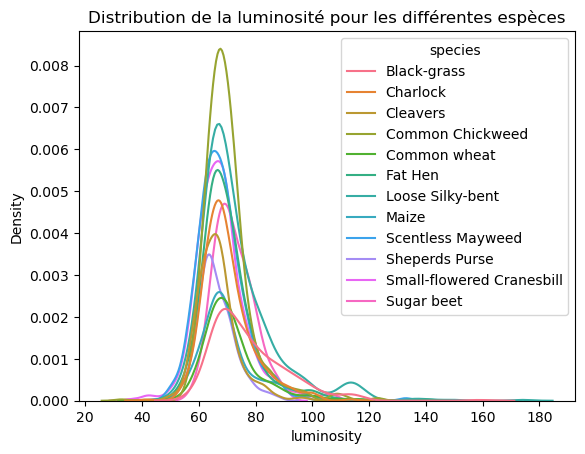

In [9]:
#Graphique de densité sur la distribution de la luminosité pour chaque espèce
sns.kdeplot(x ='luminosity', data = df, hue = 'species')
plt.title('Distribution de la luminosité pour les différentes espèces');

La luminosité d'une image du dataset oscille en moyenne entre 60 et 80 indépendamment de la variété à laquelle elle appartient. La variété Cleavers présente la distribution de luminosité la plus étroite (images de luminosité proches). 

Les variétés suivantes présentent les répartitions de luminosité les plus étendues: Fat Hen, Common wheat, Black-grass. 
Sur l’ensemble du dataset, les images présentent pour la majorité une luminosité similaire.


        5 - Synthèse et perspectives de preprocessing

Notre jeu de données étant constitué de données non-structurées (images), le preprocessing sera concrètement effectué directement au moment de la modélisation, en entrée des algorithmes.
L'exploration des données a cependant permis de mettre en lumière certaines caractéristiques importantes du jeu de données, qui nous permettront d'orienter nos choix de preprocessing et de modélisation, et pourront également nous guider pour l'interprétation des résultats: 

Les 12 classes de la variable cible ne sont pas parfaitement équilibrées, mais le niveau de déséquilibre reste modéré et ne semble a priori pas nécessiter de traitement spécifique à l'étape de modélisation. Ce point restera à confirmer à partir des premiers résultats.

Les images comportent toutes un arrière-plan similaire, constitué de cailloux et éventuellement d'une barquette, parfois accompagnée d'une bande de mesure. On peut se poser la question d'une éventuelle suppression de ce fond avant classification des images. Ce point est développé un peu plus bas.

La très grande majorité des images sont carrées, nous considérerons donc le format carré comme le format standard de notre dataset. Du fait de l'existence d'une relation statistiquement significative entre la dimension des images et la variable cible (espèce d'appartenance), nous procéderons à un redimensionnement systématique des images au moment du preprocessing. Ainsi, le modèle pourra se lancer avec les images redimensionnées.

Certaines images présentent un niveau de flou élevé, qui pourrait éventuellement dégrader les performances du modèle. Ce point est à garder en tête au moment de l'analyse des résultats: les images les moins bien classées correspondent-elles aux images floues ?

L'étude du flou a également permis d'émettre l'hypothèse que les plus petites images sont en fait des images zoomées a posteriori par troncage. Dans ce cas le niveau de zoom (et donc la taille des cailloux qui constituent le fond des images) serait corrélé à la dimension des images, elle-même fortement corrélée à l'espèce d'appartenance. Ce point est également à garder en tête au moment de l'analyse des résultats: il sera intéressant de vérifier que le modèle ne se base pas sur le fond des images (par exemple sur la taille des cailloux) pour effectuer la classification. Dans le cas contraire il faudra envisager une étape supplémentaire de suppression de l'arrière-plan dans le preprocessing.

Enfin les différentes classes d'images présentent des niveaux de luminosité très similaires, il ne sera donc a priori pas nécessaire de corriger la luminosité au moment du preprocessing. La distribution des couleurs est également bien équilibrée entre les classes et ne constitue donc pas un critère discrimimant pour la classification. On peut de ce fait se poser la question de la conversion des images en noir & blanc dans le but de réduire la dimension des données.
